<a href="https://colab.research.google.com/github/OAlbuja/3-column-preview-card/blob/master/The_Stochastic_Neuron_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **The Stochastic Neuron Model**

**Group Members:**
- Juan J. Miño
- Jaime Mendoza
- Felipe Robalino
- Oscar Albuja

## **Introduction**

The following notebook corresponds to the final project of the class "Modelos y Simulaciones" from the "Universidad de las Américas", where the instructions are the following:

Build a stochastic neural model with subthreshold oscillations and spiking activity. The spontaneous evolution of the activity of an isolated neuron follows a random walk. The neuron activity is considered as a discrete variable and characterized in time by:

> 𝑎(𝑡+1)= 𝑎𝑖(𝑡)+𝐶, with probability 𝑝, 𝑎𝑖(𝑡), otherwise

Where:
- 𝑝 is the transit probability of its internal state per time step. Therefore 1−𝑝 is the probability of remaining in the current state.
- 𝐶 is a parameter that depends on the temporal evolution of the unit activity. This parameter can have three different values.

The neuron starts to increase its activity from an initial state 𝑎=0, with probability 𝑝, using 𝐶=1. If the neuron reaches its activation threshold, 𝐿, it produces a spike according to a firing probability 𝑝𝑓. The activity is incremented in 3𝐿 in order to model the spike event.

After the spike, the neuron activity begins to decrease to the initial state following equation 1 with 𝐶=−𝐿, 𝑝=1 until it reaches the lower activity (𝑎=0). When the unit reaches the threshold and it does not fire, with probability 1−𝑝𝑓, its activation begins to decrease again, but now 𝐶=−𝐿/5, 𝑝=1.

## **Step zero: library import**

In [ ]:
#Library import
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
import matplotlib.colors as mcolors
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Instalation in order to allow animations to work in google colab
!pip install matplotlib ffmpeg


## **First step: implementing one single neuron**

In [ ]:
#Definition of a single neuron behaviour

def single_neuron(num_steps, transit_prob, C_Variable, firing_prob, activation_threshold):
    activity = np.zeros(num_steps + 1)                                          # Create a zeros array that will store the neurons activity
    activity[0] = 0                                                             # The neurons activity starts at zero
    declineAfterFire = False                                                    # This variable indicates if the neurons acitivity is declining after a spike
    declineAfterNotFire = False                                                 # This variable indicates if the neurons acitivity is declining after not firing
    for t in range(num_steps):
      if declineAfterFire:                                                      # If the neuron is declining after a spike
        activity[t+1] = max(0, activity[t] - activation_threshold)              # The next activity value will be the current minus L, or zero (if it goes below zero)
        if activity[t+1] <= 0:
          declineAfterFire = False                                              # If the next activity value will be zero or below, then the declining stops
          continue
      elif declineAfterNotFire:                                                 # If the neuron is declining after not firing
        activity[t+1] = max(0, activity[t] - activation_threshold/5)            # The next activity value will be the current minus L/5, or zero (if it goes below zero)
        if activity[t+1] == 0:
          declineAfterNotFire = False                                           # If the next activity value will be zero, then the declining stops
          continue
      elif declineAfterFire == False and declineAfterNotFire == False:          # If the cell is not declining
        if activity[t] >= 0 and activity[t] < activation_threshold:             # We first check if the neuron's activity is within the threshold level
            if np.random.random() < transit_prob:                               # A random variable decides if the state increments or stays according to the probability of transition
                activity[t+1] = activity[t] + C_Variable                        # The activity increments by C
            else:
                activity[t+1] = activity[t]                                     # The activity stays
        elif activity[t] >= activation_threshold and activity[t] < 2*activation_threshold : # The neuron reaches or surpasses the threshold level
            if np.random.random() < firing_prob:                                # The firing probability is tested
                activity[t+1] = activity[t] + 3 * activation_threshold          # If the probability is met, the neuron fires to a level of 3L
                declineAfterFire = True                                         # The decline after fire begins
            else:
                activity[t+1] = activity[t] - activation_threshold/5            # If the firing probability is not met, the decline after not fire begins
                declineAfterNotFire = True
    return activity                                                             # Return the activity array


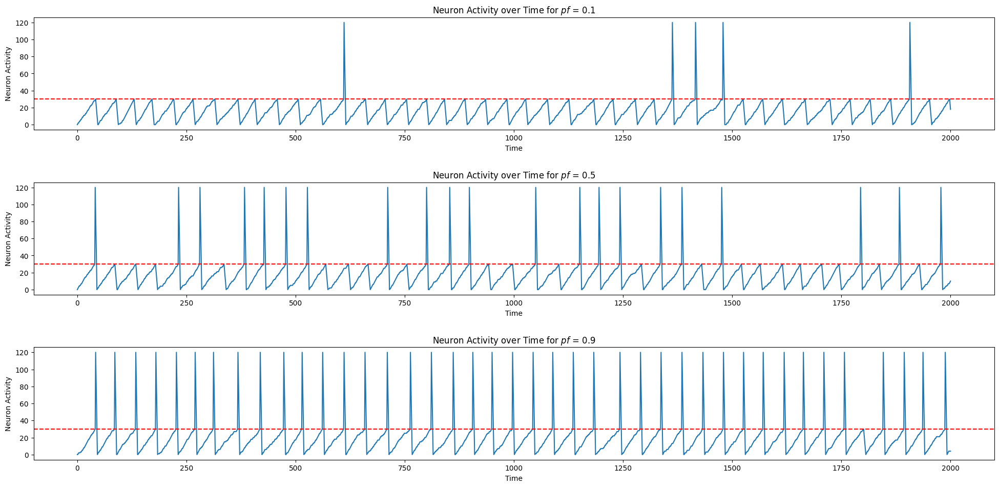

In [ ]:
#Plotting of a single neuron behaviour under different firing probabilities
pf = [0.1, 0.5, 0.9]                                                            # Will test these three firing probabilities
num_steps = 2000                                                                # Number of time steps to simulate
transit_prob = 0.7                                                              # Probability of transitioning to a higher activity state will be 0.7 for all tests
activation_threshold = 30                                                       # Activation threshold of the neuron will be set to 30 for all tests
C_variable = 1                                                                  # C variable will be 1

napf1 = single_neuron(num_steps, transit_prob, C_variable,pf[0], activation_threshold) #Get the neuron activity for a pf = 0.1
napf2 = single_neuron(num_steps, transit_prob, C_variable,pf[1], activation_threshold) #Get the neuron activity for a pf = 0.5
napf3 = single_neuron(num_steps, transit_prob, C_variable,pf[2], activation_threshold) #Get the neuron activity for a pf = 0.9

time_steps = np.linspace(0, num_steps, num_steps + 1)                           # Create a continuous x axis for the graphs

fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(20, 10))                     # Create three subplots, one for each pf

ax1.plot(time_steps, napf1)                                                     # Plot data on each subplot
ax2.plot(time_steps, napf2)
ax3.plot(time_steps, napf3)

for ax in (ax1, ax2, ax3):                                                      # Plot a cutted red line to visually know where the threshold is
    ax.axhline(y=activation_threshold, color='red', linestyle='--')

# Set titles and labels for each subplot
ax1.set_title('Neuron Activity over Time for $pf$ = {}'.format(pf[0]))
ax1.set_xlabel('Time')
ax1.set_ylabel('Neuron Activity')

ax2.set_title('Neuron Activity over Time for $pf$ = {}'.format(pf[1]))
ax2.set_xlabel('Time')
ax2.set_ylabel('Neuron Activity')

ax3.set_title('Neuron Activity over Time for $pf$ = {}'.format(pf[2]))
ax3.set_xlabel('Time')
ax3.set_ylabel('Neuron Activity')

plt.tight_layout(pad=2.5)                                                       # Adjust spacing between subplots

plt.show()                                                                      # Display the figure

#### **Interpretation**

In these three graphs we can observe the behaviour of one single neuron for different firing probabilities. The relation between the pf and their corresponding graphs is quite evident, as for a higher pf, there are more times that the neuron spikes. This is due to the fact that for every time the neuron's activity reaches the threshold, the neuron has a higher probability of being shot.

## **Second step: Building a three neuron network fully connected**

The neurons are connected emulating electrical coupling, and the interchange rule between unit 𝑖 and its neighbors 𝑗 is defined by:

𝑎𝑖(𝑡)=𝑎𝑖(𝑡)+𝑔 ∑𝑗=𝑛𝑒𝑖𝑔ℎ𝑏𝑜𝑟𝑠[𝑎𝑗(𝑡−1)−𝑎𝑖(𝑡−1)]

where 𝑔 is the electrical coupling conductance and 𝑎𝑗(𝑡) is the activity of its neighbor 𝑗. The value of the conductance 𝑔 is the same in every connection. The electrical coupling induces a local synchronization in the network as a function of 𝑔.

### **Implementation**

For creating a three neuron network, full connected, we used an approach that includes classes. Each neuron in the network will be an instance of a class called Neurona. With this approach we seek to have knowledge of each neurons actual value, past value, x and y coordinate in the network. This information is key in order to implement the changes over time that the network will have. We also need this information to follow the electrical coupling emulated formula for the definition of each neuron's activity.

#### **Defining a single neuron**

In [ ]:
#Definition of the class Neurona
class Neurona:
    def __init__(self,x, y, L, C, pf, pt):
        self.x = x                                                              # X coordinate of this neuron in the network
        self.y = y                                                              # Y coordinate of this neuron in the network
        self.estadoPrevio = 0                                                   # The previous state of this neuron
        self.estadoActual = 0                                                   # The actual state of this neuron
        self.estadoAuxiliar = 0                                                 # An auxiliar variable that will store the next calculated state of the neuron
        self.declineAfterFire = False                                           # A boolean to know if the neuron is in process of declining after a spike
        self.declineAfterNotFire = False                                        # A boolean to know if the neuron is in process of declining after not firing

        #Parameters that will be used to calculate the intrinsic behaviour of the neuron, as shown in the single neuron behaviour
        self.L = L
        self.C = C
        self.pf = pf
        self.pt = pt

    def evaluacionActividad(self,g,vecinos):                                    # This method is the one that will calculate the neurons next activity
        if self.declineAfterFire:                                               # This logic of this methos is already described in the behaviour of a single neuron, only the changes will be explained
          self.estadoAuxiliar = max(0, self.estadoActual - self.L)
          if self.estadoAuxiliar <= 0:
            self.declineAfterFire = False
        elif self.declineAfterNotFire:
          self.estadoAuxiliar = max(0, self.estadoActual - self.L/5)
          if self.estadoAuxiliar <= 0:
            self.declineAfterNotFire = False
        elif self.declineAfterFire == False and self.declineAfterNotFire == False:
          if self.estadoActual >= 0 and self.estadoActual < self.L:
              if np.random.random() < self.pt:
                  self.estadoAuxiliar = self.estadoActual + self.C
              else:
                  self.estadoAuxiliar = self.estadoActual                       # In this part, the intrinsic evaluation for the neurons activity finishes

              self.estadoAuxiliar = self.estadoAuxiliar + self.evaluacionVecinos(g,vecinos)  # Now, we evaluate the neighbors past activiy with the method "evaluacionVecinos" and we add it to the result of the intrinsic evaluation
          elif self.estadoActual >= self.L and self.estadoActual < 2*self.L:    # With the neighbors past activity taken into account, we can proceed with the rest of the logic
              if np.random.random() < self.pf:
                  self.estadoAuxiliar = self.estadoActual + 3 * self.L
                  self.declineAfterFire = True
              else:
                  self.estadoAuxiliar = self.estadoActual - self.L/5
                  self.declineAfterNotFire = True

    def evaluacionVecinos(self, g, vecinos):                                    # This method receives a g value for the electrical coupling conductance, and an array with all the neighbors past values
        suma=0                                                                  # The sum is initialiced
        for vec in vecinos:                                                     # For each value in the array, we increment the sum with the result of substracting the value with the actual neuron's previous value
          suma+= (vec-self.estadoPrevio)
        return g*suma                                                           # We return the product of g and the sum, for the method "evaluacionActividad" to use it

    def actualizarEstados(self):                                                # This method refreshes the states of the neuron for a next iteration of the neural network.
        self.estadoPrevio = self.estadoActual                                   # The previous state is now the actual state
        self.estadoActual = self.estadoAuxiliar                                 # The actual state is now the calculated state stored in the auxiliar state

    def identificarse(self):
      print("({},{}) - Estado Actual: {}, Estado Previo: {}".format(self.x, self.y, self.estadoActual, self.estadoPrevio)) #This method is used in tests to identify each neuron's coordinates, actual value and previous value

    def getPreviousValue(self):                                                 # Getter for the previous value
          return self.estadoPrevio

    def getActualValue(self):                                                   # Getter for the actual value
          return self.estadoActual




#### **Creating the network**

In [ ]:
#Declaration of the network and instanciation of the nodes
grid_size = 3                                                                   # This will be the n value for an n by n network. In this second exercise though, the network wont have an n by n dimension, but a 1 x n dimension, as it only has 3 neurons
G = nx.grid_2d_graph(1, grid_size)                                              # We use the networkx library to create the desired network. This library becomes really usefull to map neurons and its neighbors
matrix = np.zeros((1, grid_size))                                               # We create a matrix that will store the actual values of the network, has to have the same dimensions as the network

neuronas = {}                                                                   # neuronas is a dictionary where all the instances of the class Neurona will be stored. The keys of the dictionary will be the coordinates of the neuron


for node in G.nodes:                                                            # Traverse all the nodes in the network created with networkx
    x, y = node                                                                 # The node is a tuple (x, y) representing the coordinates
    L = 30                                                                      # Initialize Neurona instance with appropriate parameters
    C = 1
    pf = 0.9
    pt = 0.7
    neurona_instance = Neurona(x, y, L, C, pf, pt)                              # Create Neurona instance for the node with its coordinates (x, y)
    neuronas[(x, y)] = neurona_instance                                         # Store the Neurona instance in the dictionary using the node's coordinates as the key

def mapActualValues():                                                          # This method maps the actual values of all neurons in the dictionary to the matrix
  for neurona in neuronas:
    n = neuronas[neurona]
    matrix[neurona[0]][neurona[1]] = n.getActualValue()

def changeState(g):                                                             # This method runs the logic for all nodes in the network to calculate their auxiliar new states
  for neurona in neuronas:                                                      # For each neurona in the dictionary
    n = neuronas[neurona]                                                       # Get the value from the dictionary
    vecinos = np.array(list(G.neighbors(neurona)))                              # Get all the neighbors of that neuron
    valoresPreviosVecinos = []                                                  # Initialice an array that will store all the previous values of the neuron's neighbors
    for vec in vecinos:                                                         # For each neighbor in vecinos
      nvec = neuronas[tuple(vec)]                                               # Get the value from the dictionary
      valoresPreviosVecinos.append(nvec.getPreviousValue())                     # Append the neuron's previous value to the array
    n.evaluacionActividad(g,valoresPreviosVecinos)                              # Make the neuron calculate its next activity value taking into account its neighbors previous value

def actualizarValoresNeuronas():                                                # This method refreshes the values of all neurons in the network, making their past value equal their actual value, and their actual value equal the value they calculated in auxiliar value
  for neurona in neuronas:
    n = neuronas[neurona]
    n.actualizarEstados()

neurona1 = []                                                                   # For this exercise, with just three neurons, we create one activity array for each neuron
neurona2 = []
neurona3 = []
mapActualValues()                                                               # Do a first mapping of the values in all three neurons

for i in range(200):                                                            # For 200 steps
  neurona1.append(matrix[0][0])                                                 # Append the corresponding values from the matrix to the corresponding arrays
  neurona2.append(matrix[0][1])
  neurona3.append(matrix[0][2])
  changeState(0.01)                                                             # Change the state of the network with g = 0.01
  actualizarValoresNeuronas()                                                   # Refresh the values
  mapActualValues()                                                             # Map them again into the matrix


#### **Plotting a line graph for g = 0.01 and g = 0.17**

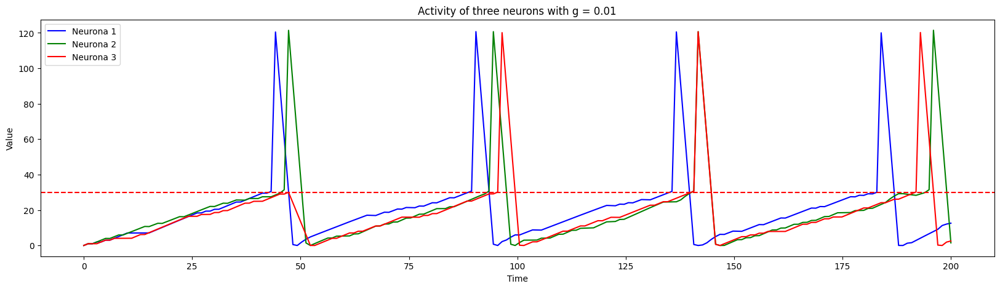

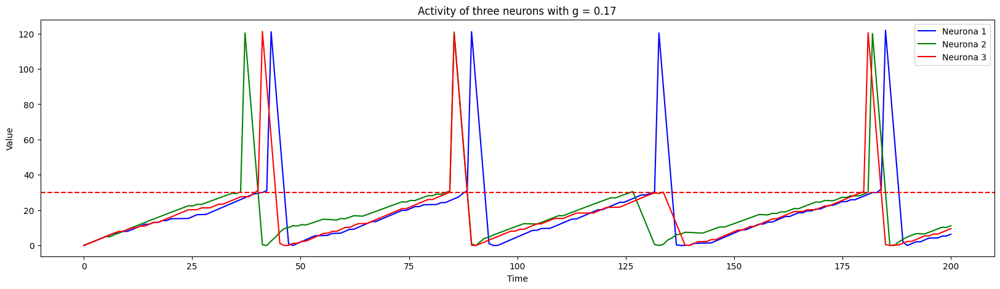

In [ ]:
# Plotting the line graph to observe the three neuron activity
def plotGraphs(g):
    grid_size = 3                                                               # This will be the n value for an n by n network. In this second exercise though, the network wont have an n by n dimension, but a 1 x n dimension, as it only has 3 neurons
    G = nx.grid_2d_graph(1, grid_size)                                          # We use the networkx library to create the desired network. This library becomes really usefull to map neurons and its neighbors
    matrix = np.zeros((1, grid_size))                                           # We create a matrix that will store the actual values of the network, has to have the same dimensions as the network

    neuronas = {}                                                               # neuronas is a dictionary where all the instances of the class Neurona will be stored. The keys of the dictionary will be the coordinates of the neuron


    for node in G.nodes:                                                        # Traverse all the nodes in the network created with networkx
        x, y = node                                                             # The node is a tuple (x, y) representing the coordinates
        L = 30                                                                  # Initialize Neurona instance with appropriate parameters
        C = 1
        pf = 0.9
        pt = 0.7
        neurona_instance = Neurona(x, y, L, C, pf, pt)                          # Create Neurona instance for the node with its coordinates (x, y)
        neuronas[(x, y)] = neurona_instance                                     # Store the Neurona instance in the dictionary using the node's coordinates as the key

    def mapActualValues():                                                      # This method maps the actual values of all neurons in the dictionary to the matrix
      for neurona in neuronas:
        n = neuronas[neurona]
        matrix[neurona[0]][neurona[1]] = n.getActualValue()

    def changeState(g):                                                         # This method runs the logic for all nodes in the network to calculate their auxiliar new states
      for neurona in neuronas:                                                  # For each neurona in the dictionary
        n = neuronas[neurona]                                                   # Get the value from the dictionary
        vecinos = np.array(list(G.neighbors(neurona)))                          # Get all the neighbors of that neuron
        valoresPreviosVecinos = []                                              # Initialice an array that will store all the previous values of the neuron's neighbors
        for vec in vecinos:                                                     # For each neighbor in vecinos
          nvec = neuronas[tuple(vec)]                                           # Get the value from the dictionary
          valoresPreviosVecinos.append(nvec.getPreviousValue())                 # Append the neuron's previous value to the array
        n.evaluacionActividad(g,valoresPreviosVecinos)                          # Make the neuron calculate its next activity value taking into account its neighbors previous value

    def actualizarValoresNeuronas():                                            # This method refreshes the values of all neurons in the network, making their past value equal their actual value, and their actual value equal the value they calculated in auxiliar value
      for neurona in neuronas:
        n = neuronas[neurona]
        n.actualizarEstados()

    neurona1 = []                                                               # For this exercise, with just three neurons, we create one activity array for each neuron
    neurona2 = []
    neurona3 = []
    mapActualValues()                                                           # Do a first mapping of the values in all three neurons

    for i in range(200):                                                        # For 200 steps
      neurona1.append(matrix[0][0])                                             # Append the corresponding values from the matrix to the corresponding arrays
      neurona2.append(matrix[0][1])
      neurona3.append(matrix[0][2])
      changeState(0.01)                                                         # Change the state of the network with g = 0.01
      actualizarValoresNeuronas()                                               # Refresh the values
      mapActualValues()

    num_points = 200                                                            # The number of points in the plot
    start_time = 0                                                              # Start value for the graph
    end_time = 200                                                              # End value for the graph

    time_steps = np.linspace(start_time, end_time, num=num_points)              # Creation of the x axis

    plt.figure(figsize=(20, 5))                                                 # Size of the graph

    # Plot each array as a separate line
    plt.plot(time_steps, neurona1, label="Neurona 1", color='blue')
    plt.plot(time_steps, neurona2, label="Neurona 2", color='green')
    plt.plot(time_steps, neurona3, label="Neurona 3", color='red')

    # Add title, labels and legend
    plt.title("Activity of three neurons with g = {}".format(g))
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.legend()

    # Plot the threshold level
    plt.axhline(y=30, color='red', linestyle='--')

    # Show the plot
    plt.show()

plotGraphs(0.01)                                                                # Plot a graph for a g = 0.01
plotGraphs(0.17)                                                                # Plot a graph for a g = 0.17

### **Interpretation**

For the implementation of the three neurons, one thing to consider is that it was designed to work for three neurons, or any number of neurons. One has to only change the size of the network and it works. In this case we can see that for a higher electrical coupling conductance (g) value, the neurons tend to synchronize. As for the interpretation of these two graphs, they are meant to understand the role of g within the neuron's behaviour, for which we present the following conclusions:

- The conductance parameter (g) represents the strength of electrical coupling between neurons. It determines how much influence a neuron's neighbors have on its activity.
- A higher value of g means stronger coupling, leading to a more significant impact of neighbors' activity on a neuron's activity. Conversely, a lower value of g reduces the influence of neighbors.
- When g is set to zero, it effectively decouples the neurons, meaning each neuron's activity is determined solely by its intrinsic behavior.
- As g increases, neurons become more synchronized in their activity, and the network's dynamics become more dependent on the interactions among neurons. Which can be observed with the graphs presented above.

## **Third step: Building a 30 by 30 network**

### **Implementation**

For this part, we will use the same logic and code as before with the three neurons. This time, the size of the network in networkx will be 30 by 30 and so will  be the size of the matrix used to map the values of the network. At the end, we present you an animation of the network working.

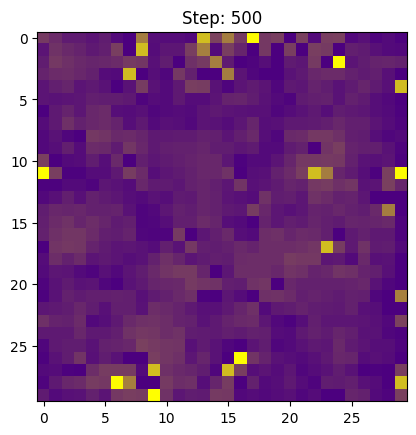

In [ ]:
#Declaration of the network and instanciation of the nodes
grid_size = 30
G = nx.grid_2d_graph(grid_size, grid_size)
matrix = np.zeros((grid_size, grid_size))
num_time_steps = 500
averageNetworkActivity = []

# Custom colormap from dark purple to yellow
colors = [(0.3, 0, 0.5), (1, 1, 0)]  # (R, G, B) values for dark purple and yellow
cmap = mcolors.LinearSegmentedColormap.from_list('custom_cmap', colors, N=123)

# Initialize an empty matrix to store the states of neurons at each time step
matrix_states = np.zeros((num_time_steps, grid_size, grid_size))

neuronas = {}

for node in G.nodes:
    x, y = node  # The node is a tuple (x, y) representing the coordinates
    # Initialize Neurona instance with appropriate parameters
    L = 30
    C = 1
    pf = 0.9
    pt = 0.7

    # Create Neurona instance for the node with its coordinates (x, y)
    neurona_instance = Neurona(x, y, L, C, pf, pt)

    # Store the Neurona instance in the dictionary using the node's coordinates as the key
    neuronas[(x, y)] = neurona_instance

def mapActualValues():
  for neurona in neuronas:
    n = neuronas[neurona]
    matrix[neurona[0]][neurona[1]] = n.getActualValue()

def changeState(g):
  for neurona in neuronas:
    n = neuronas[neurona]
    vecinos = np.array(list(G.neighbors(neurona)))
    valoresPreviosVecinos = []
    #print(neurona)
    for vec in vecinos:
      nvec = neuronas[tuple(vec)]
      valoresPreviosVecinos.append(nvec.getPreviousValue())
    #print(valoresPreviosVecinos)
    n.evaluacionActividad(g,valoresPreviosVecinos)

def actualizarValoresNeuronas():
  for neurona in neuronas:
    n = neuronas[neurona]
    n.actualizarEstados()

# Simulate the neural network over time
for t in range(num_time_steps):
    #We will be using a g = 0.01
    changeState(0.01)
    actualizarValoresNeuronas()
    mapActualValues()
    #Store the mean value of the network at that step
    averageNetworkActivity.append(np.mean(matrix))
    # Store the current state of neurons in the matrix_states
    matrix_states[t] = matrix.copy()

# Create a figure and axis for the plot
fig, ax = plt.subplots()

# Initialize an empty imshow object
heatmap = ax.imshow(matrix_states[0], cmap=cmap, vmin=0, vmax=122)

# Function to update the heatmap at each frame of the animation
def update(frame):
    heatmap.set_data(matrix_states[frame])  # Update the heatmap data for each frame
    ax.set_title(f"Step: {frame + 1}")

# Create the animation
ani = FuncAnimation(fig, update, frames=num_time_steps, interval=200)

# Display the animation
HTML(ani.to_jshtml())


### **Interpretation**

In this part we can finally see our network at work. Every pixel in this heatmap repesents a neuron's value. This animation shows the different states of all neurons in the network with values closer to yellow being values closer to being in a spike, and values closer to dark purple being values closer to zero. We tried out different simulations for differente values of g and this are the results we could gather:

For a g = 0.01, the simulation shows a lot of activity but only once every 40-50 steps. When one neuron begins to fire, it tends to make the other ones fire at a close time. This is an image of the network at step 95:

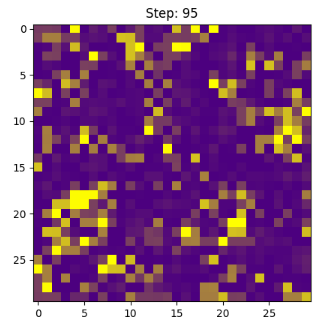

On the other hand, for a higher g, in this case g = 0.17, the activity of the whole network began faster, the spikes had fewer times in between and the activity release by a neuron propagated faster across the network. This is an image of the network at step 95:

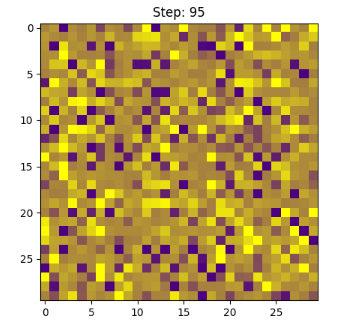

With these graphs we can clearly see that for a higher value of g, the activities of all neurons reach the threshold level faster, and are more syncronized between them.

## **Fourth step: measuring the global activity in time**

### **Implementation**

In the last part, for the implementation of the network, for every iteration of a new matrix, the mean value was measured. This means that in the array averageNetworkActivity, there are n number of mean values, n being the ammount of steps in the simulation. In the following graph we will be able to see the mean value along the steps, graphed in a line graph.

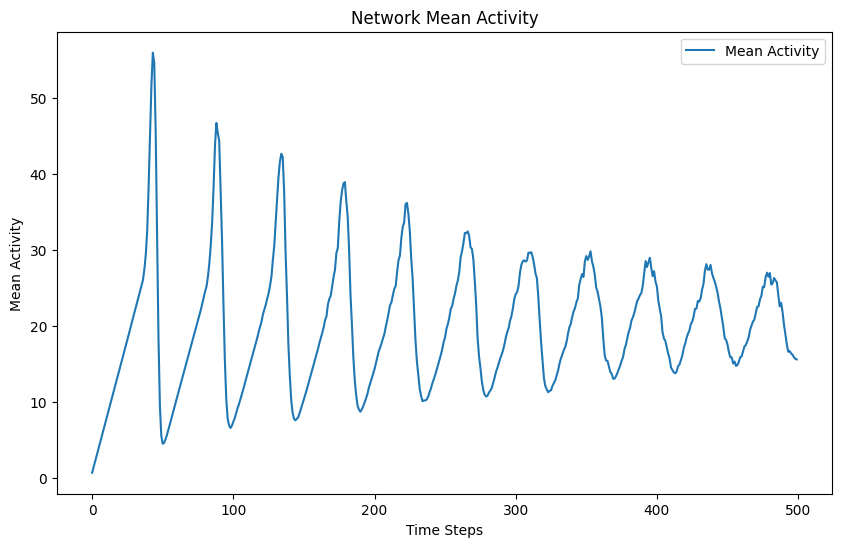

In [ ]:
# Plot the network mean activity, upper peaks, and lower peaks
plt.figure(figsize=(10, 6))
plt.plot(range(num_time_steps), averageNetworkActivity, label='Mean Activity')

plt.xlabel('Time Steps')
plt.ylabel('Mean Activity')
plt.title('Network Mean Activity')
plt.legend()

plt.show()

### **Interpretation**

As it was discussed in the previous part, with a higher value of g, there is more conduntance between neurons. In the following graph we can see the mean activity of a network with g = 0.01:

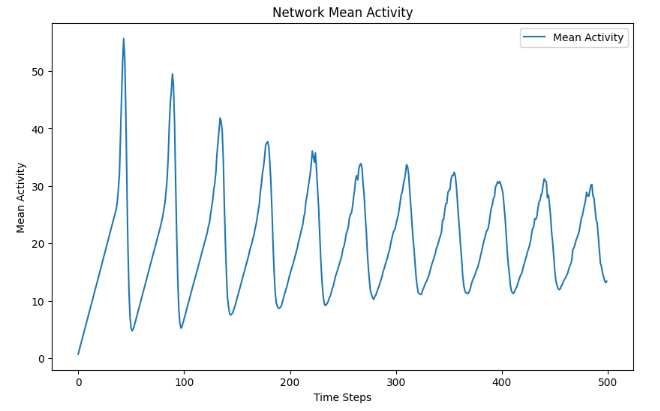

As with this other graph, we can see the mean activity of the netork with a g = 0.17:

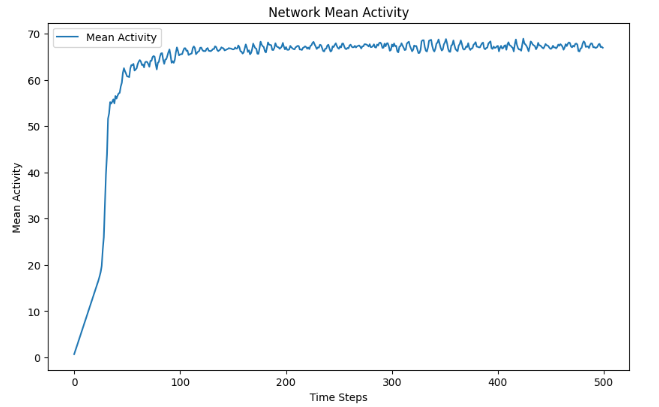

With a higher conductance, the network itself has neurons activated faster and more synchronized. This graph shows how there is an initial time where the mean activity of the network is low, but once it reaches a certain level, for every neuron that goes back to zero, there are a lot more that are being shot, which makes the mean activity stay in high levels almost all the time. Now, this behaviour does also depend on the firring probability, which has been 0.9 for all these graphs and analysis of the network, so here are the graphs for g=0.01 and g=0.17 for pf = 0.5, respectively, that show that the firing probabilty, although it does change the rate at which the neurons fire, when there is a higher value for g, the mean activiy does not vary much, and an almost looping state is achieved:

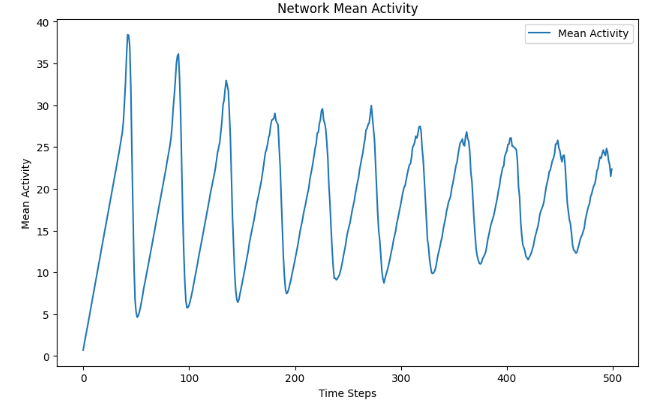

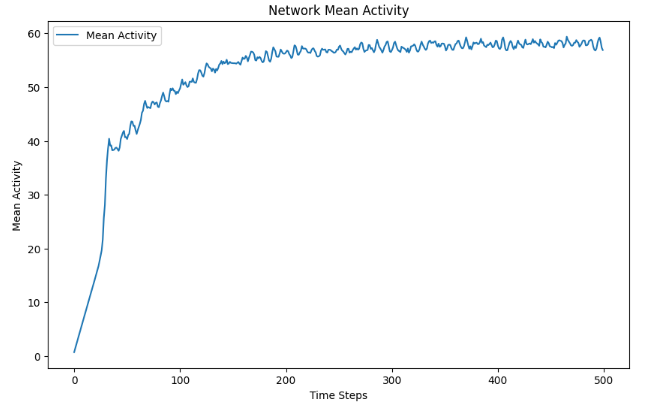

## **Fifth step: evaluating different g values**

### **Implementation**

For this last part we will graph the mean value for the mean activity values for diffent values of g. The code is already described previously.

In [ ]:
# Plotting the line graph to observe the three neuron activity
def getMeanValue(g, numSteps):
    grid_size = 30
    G = nx.grid_2d_graph(grid_size, grid_size)
    matrix = np.zeros((grid_size, grid_size))
    averageNetworkActivity = []

    neuronas = {}

    for node in G.nodes:
        x, y = node
        L = 30
        C = 1
        pf = 0.9
        pt = 0.7
        neurona_instance = Neurona(x, y, L, C, pf, pt)
        neuronas[(x, y)] = neurona_instance

    def mapActualValues():
      for neurona in neuronas:
        n = neuronas[neurona]
        matrix[neurona[0]][neurona[1]] = n.getActualValue()

    def changeState(g):
      for neurona in neuronas:
        n = neuronas[neurona]
        vecinos = np.array(list(G.neighbors(neurona)))
        valoresPreviosVecinos = []
        for vec in vecinos:
          nvec = neuronas[tuple(vec)]
          valoresPreviosVecinos.append(nvec.getPreviousValue())
        n.evaluacionActividad(g,valoresPreviosVecinos)

    def actualizarValoresNeuronas():
      for neurona in neuronas:
        n = neuronas[neurona]
        n.actualizarEstados()

    for i in range(numSteps):
      changeState(g)
      actualizarValoresNeuronas()
      averageNetworkActivity.append(np.mean(matrix))
      mapActualValues()

    return averageNetworkActivity


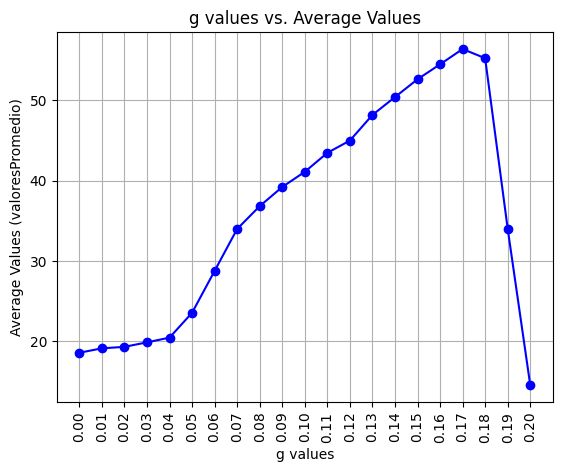

In [ ]:
# Different values for g
gValues = []

# Use a loop to generate the values from 0.01 to 0.20
for i in range(0, 21):
    value = i / 100.0  # Divide by 100 to get the decimal representation
    gValues.append(value)

# Get the mean value for every list of mean values
valoresPromedio = []

for valor in gValues:
  valoresPromedio.append(np.mean(getMeanValue(valor,200)))

plt.plot(gValues, valoresPromedio, marker='o', linestyle='-', color='b')
plt.xlabel('g values')
plt.ylabel('Average Values (valoresPromedio)')
plt.title('g values vs. Average Values')
plt.grid(True)
plt.xticks(np.arange(0, 0.21, 0.01), rotation='vertical')
plt.show()

### **Interpretation**

In this last graph we can observe the mean activity of the networks for different values of G. The important part here is that we can observe that for a higher value of g, the mean activity across time of the network increases too, that is until it reaches a value of about 0.17. When it reaches this value, the mean activity decreases considerably. This may be due to the fact that as the value is greater, the neurons reach the threshold level so fast, that they fall as fast too. So the mean activity will be influenced of a lot of high values but equal ammounts of low values, which would explain the low mean.